In [1]:
import os
import random
import json
import shutil
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from collections import Counter
from tqdm import tqdm
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms, models

from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_fscore_support
import joblib

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark = True

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cuda


# Loading the Dataset

In [2]:
DATA_ROOT  = "/kaggle/input/datasets/faridaali202301940/adni-dataset/adni_nifti_preprocessed"
OUTPUT_DIR = "/kaggle/working/preprocessed"
CKPT_DIR   = "/kaggle/working/checkpoints_vgg19_svm"
os.makedirs(CKPT_DIR, exist_ok=True)

IMAGE_SIZE    = 224
TRAIN_RATIO   = 0.80
BATCH_SIZE    = 32
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

VALID_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff'}

all_paths  = []
all_labels = []

CLASS_NAMES = sorted([
    d for d in os.listdir(DATA_ROOT)
    if os.path.isdir(os.path.join(DATA_ROOT, d))
])
print(f"Classes found: {CLASS_NAMES}")
print(f"Number of classes: {len(CLASS_NAMES)}")

for idx, cls in enumerate(CLASS_NAMES):
    cls_root = os.path.join(DATA_ROOT, cls)
    for dirpath, _, fnames in os.walk(cls_root):
        for fname in fnames:
            if os.path.splitext(fname)[1].lower() in VALID_EXTS:
                all_paths.append(os.path.join(dirpath, fname))
                all_labels.append(idx)

print(f"\nTotal images: {len(all_paths)}")
for idx, cls in enumerate(CLASS_NAMES):
    print(f"  {cls}: {all_labels.count(idx)}")

Classes found: ['AD', 'CN', 'MCI']
Number of classes: 3

Total images: 8512
  AD: 1434
  CN: 2341
  MCI: 4737


# Splitting (Train, Validation, and Test)

Following the paper's 80 / 10 / 10 split.

In [3]:
train_paths, temp_paths, train_labels, temp_labels = train_test_split(
    all_paths, all_labels,
    test_size=1 - TRAIN_RATIO,
    stratify=all_labels,
    random_state=SEED,
)

val_paths, test_paths, val_labels, test_labels = train_test_split(
    temp_paths, temp_labels,
    test_size=0.5,
    stratify=temp_labels,
    random_state=SEED,
)

print(f"\nTrain: {len(train_paths)} | Val: {len(val_paths)} | Test: {len(test_paths)}")


Train: 6809 | Val: 851 | Test: 852


In [4]:
train_set = set(train_paths)
val_set   = set(val_paths)
test_set  = set(test_paths)

overlap_train_val  = len(train_set & val_set)
overlap_train_test = len(train_set & test_set)
overlap_val_test   = len(val_set  & test_set)

print(f"Train-Val overlap:   {overlap_train_val}")
print(f"Train-Test overlap:  {overlap_train_test}")
print(f"Val-Test overlap:    {overlap_val_test}")

if overlap_train_val == 0 and overlap_train_test == 0 and overlap_val_test == 0:
    print("✓ No data leakage")
else:
    print("✗ Data leakage detected!")

Train-Val overlap:   0
Train-Test overlap:  0
Val-Test overlap:    0
✓ No data leakage


In [5]:
print("\nClass distribution:")
for name, lbls in [("train", train_labels), ("val", val_labels), ("test", test_labels)]:
    c = Counter(lbls)
    print(f"  {name}: {dict(sorted(c.items()))}")


Class distribution:
  train: {0: 1147, 1: 1873, 2: 3789}
  val: {0: 143, 1: 234, 2: 474}
  test: {0: 144, 1: 234, 2: 474}


# Saving Tensors

Images are converted to grayscale (matching MRI scans), resized to 224×224, then saved as pre-processed `.pt` tensors for fast loading.

In [6]:
if os.path.exists(OUTPUT_DIR):
    shutil.rmtree(OUTPUT_DIR)
os.makedirs(OUTPUT_DIR, exist_ok=True)

filename_usage = {}

def save_tensors(paths, labels, split_name):
    split_dir = os.path.join(OUTPUT_DIR, split_name)
    for path, label in tqdm(zip(paths, labels), total=len(paths), desc=f"Saving {split_name}"):
        cls_name = CLASS_NAMES[label]
        out_dir  = os.path.join(split_dir, cls_name)
        os.makedirs(out_dir, exist_ok=True)

        base_fname   = os.path.splitext(os.path.basename(path))[0]
        tracking_key = f"{cls_name}_{base_fname}"

        if tracking_key in filename_usage:
            filename_usage[tracking_key] += 1
            unique_fname = f"{base_fname}_dup{filename_usage[tracking_key]}.pt"
        else:
            filename_usage[tracking_key] = 0
            unique_fname = f"{base_fname}.pt"

        out_path = os.path.join(out_dir, unique_fname)

        img    = Image.open(path).convert("L")
        img    = img.resize((IMAGE_SIZE, IMAGE_SIZE))
        tensor = transforms.ToTensor()(img)
        tensor = tensor.repeat(3, 1, 1)
        tensor = (tensor * 255).byte()
        torch.save(tensor, out_path)

save_tensors(train_paths, train_labels, "train")
save_tensors(val_paths,   val_labels,   "val")
save_tensors(test_paths,  test_labels,  "test")

print("All tensors saved.")

Saving test: 100%|██████████| 852/852 [00:05<00:00, 156.69it/s]

All tensors saved.


# Dataset Class

In [7]:
normalize = transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)

class AlzheimerDataset(Dataset):
    def __init__(self, split_dir, class_names):
        self.samples = []
        for idx, cls in enumerate(class_names):
            cls_dir = os.path.join(split_dir, cls)
            if not os.path.isdir(cls_dir):
                continue
            for fname in os.listdir(cls_dir):
                if fname.endswith(".pt"):
                    self.samples.append((os.path.join(cls_dir, fname), idx))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        tensor = torch.load(path, weights_only=True).float() / 255.0
        return normalize(tensor), label

    def get_labels(self):
        return [s[1] for s in self.samples]

In [8]:
train_ds = AlzheimerDataset(os.path.join(OUTPUT_DIR, "train"), CLASS_NAMES)
val_ds   = AlzheimerDataset(os.path.join(OUTPUT_DIR, "val"),   CLASS_NAMES)
test_ds  = AlzheimerDataset(os.path.join(OUTPUT_DIR, "test"),  CLASS_NAMES)

print(f"\nDataset sizes:")
print(f"Train: {len(train_ds)} | Val: {len(val_ds)} | Test: {len(test_ds)}")


Dataset sizes:
Train: 6809 | Val: 851 | Test: 852


# DataLoaders

For feature extraction we use `shuffle=False` on all splits so indices stay aligned with labels.

In [9]:
train_labels_list = train_ds.get_labels()
class_counts      = Counter(train_labels_list)
print(f"\nTraining class distribution: {dict(sorted(class_counts.items()))}")

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=4, pin_memory=True, persistent_workers=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=4, pin_memory=True, persistent_workers=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=4, pin_memory=True, persistent_workers=True)


Training class distribution: {0: 1147, 1: 1873, 2: 3789}


# Model — VGG19 Freeze Feature Extractor + SVM

Exactly as described in the paper (Naz et al., 2022):

- **VGG19** pre-trained on ImageNet (source domain)
- **All layers frozen** — no weight updates (freeze approach)
- **FC6** (first fully-connected layer, `classifier[0]`, 4096-dim) used as the feature vector
- Features passed to an **RBF-kernel SVM** for classification
- Three binary classifiers trained: AD vs CN, MCI vs AD, MCI vs CN

In [10]:
def build_vgg19_extractor():
    """
    VGG19 pre-trained on ImageNet with ALL parameters frozen.
    Used purely as a fixed feature extractor — no fine-tuning.
    Matches the paper's 'freeze features' transfer learning approach.
    """
    model = models.vgg19(weights=models.VGG19_Weights.IMAGENET1K_V1)
    for param in model.parameters():
        param.requires_grad = False
    model.eval()
    return model

extractor = build_vgg19_extractor()
extractor.to(device)

total_params     = sum(p.numel() for p in extractor.parameters())
trainable_params = sum(p.numel() for p in extractor.parameters() if p.requires_grad)
print(f"VGG19 loaded.")
print(f"  Total parameters    : {total_params:,}")
print(f"  Trainable parameters: {trainable_params:,}  (0 — all frozen ✓)")
print(f"  Feature layer       : classifier[0]  →  FC6  (4096-dim)")

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:02<00:00, 204MB/s]  


VGG19 loaded.
  Total parameters    : 143,667,240
  Trainable parameters: 0  (0 — all frozen ✓)
  Feature layer       : classifier[0]  →  FC6  (4096-dim)


# FC6 Feature Extraction

A forward hook is attached to `model.classifier[0]` (the raw linear FC6 layer, 
pre-ReLU) to capture the 4096-dimensional feature vector for every image.
This exactly matches the paper's FC6 extraction strategy for VGG19.

In [11]:
def extract_fc6_features(loader, model, desc="Extracting features"):
    """
    Extract 4096-dim FC6 features from VGG19's classifier[0] layer.
    Returns:
        features : np.ndarray  (N, 4096)
        labels   : np.ndarray  (N,)
    """
    features_list = []
    labels_list   = []
    fc6_output    = {}

    def hook_fn(module, input, output):
        fc6_output['feat'] = output.detach().cpu()

    hook = model.classifier[0].register_forward_hook(hook_fn)

    model.to(device)
    model.eval()

    with torch.no_grad():
        for images, labels in tqdm(loader, desc=desc, leave=False):
            images = images.to(device, non_blocking=True)
            _      = model(images)
            features_list.append(fc6_output['feat'].numpy())
            labels_list.extend(labels.numpy().tolist())

    hook.remove()

    features = np.vstack(features_list)
    labels   = np.array(labels_list)
    return features, labels

print("Feature extractor defined.")

Feature extractor defined.


# Extract Features for All Splits

In [12]:
print("Extracting train features...")
X_train, y_train = extract_fc6_features(train_loader, extractor, "Train FC6")

print("Extracting val features...")
X_val,   y_val   = extract_fc6_features(val_loader,   extractor, "Val FC6")

print("Extracting test features...")
X_test,  y_test  = extract_fc6_features(test_loader,  extractor, "Test FC6")

print(f"\nFeature shapes:")
print(f"  Train : {X_train.shape}  labels: {y_train.shape}")
print(f"  Val   : {X_val.shape}    labels: {y_val.shape}")
print(f"  Test  : {X_test.shape}   labels: {y_test.shape}")

Extracting train features...


Extracting val features...


Extracting test features...



Feature shapes:
  Train : (6809, 4096)  labels: (6809,)
  Val   : (851, 4096)    labels: (851,)
  Test  : (852, 4096)   labels: (852,)


# SVM Classifiers — One per Binary Pair

The paper trains **separate binary SVMs** for each classification scenario:
- **Scenario 1**: MCI vs AD
- **Scenario 2**: AD vs CN  
- **Scenario 3**: MCI vs CN

Features are StandardScaler-normalised before fitting.
RBF kernel SVM with `class_weight='balanced'` to handle class imbalance.

In [13]:
SCENARIOS = [
    ("MCI", "AD"),
    ("AD",  "CN"),
    ("MCI", "CN"),
]

def filter_binary(X, y, class_a, class_b):
    """Keep only samples belonging to class_a or class_b and relabel to 0/1."""
    idx_a = CLASS_NAMES.index(class_a)
    idx_b = CLASS_NAMES.index(class_b)
    mask  = (y == idx_a) | (y == idx_b)
    X_f   = X[mask]
    y_f   = (y[mask] == idx_b).astype(int)
    return X_f, y_f

svm_results = {}

print(f"{'='*65}")
print(f"  TRAINING SVM  —  VGG19 FC6 Freeze Features  (paper replication)")
print(f"{'='*65}\n")

for (cls_a, cls_b) in SCENARIOS:
    tag = f"{cls_a}_vs_{cls_b}"
    print(f"--- {cls_a} vs {cls_b} ---")

    Xtr, ytr = filter_binary(X_train, y_train, cls_a, cls_b)
    Xvl, yvl = filter_binary(X_val,   y_val,   cls_a, cls_b)
    Xte, yte = filter_binary(X_test,  y_test,  cls_a, cls_b)

    scaler   = StandardScaler()
    Xtr_sc   = scaler.fit_transform(Xtr)
    Xvl_sc   = scaler.transform(Xvl)
    Xte_sc   = scaler.transform(Xte)

    svm = SVC(kernel='rbf', C=10.0, gamma='scale',
              class_weight='balanced',
              random_state=SEED, probability=True)
    svm.fit(Xtr_sc, ytr)

    val_acc  = svm.score(Xvl_sc, yvl) * 100
    test_acc = svm.score(Xte_sc, yte) * 100

    print(f"  Val  accuracy: {val_acc:.2f}%")
    print(f"  Test accuracy: {test_acc:.2f}%  ← compare to paper")
    print()

    svm_results[tag] = {
        'svm': svm, 'scaler': scaler,
        'val_acc': val_acc, 'test_acc': test_acc,
        'cls_a': cls_a, 'cls_b': cls_b,
        'X_test': Xte_sc, 'y_test': yte,
    }

    joblib.dump({'svm': svm, 'scaler': scaler},
                os.path.join(CKPT_DIR, f"svm_{tag}.pkl"))

print("All SVM models trained and saved.")

  TRAINING SVM  —  VGG19 FC6 Freeze Features  (paper replication)

--- MCI vs AD ---
  Val  accuracy: 99.03%
  Test accuracy: 98.87%  ← compare to paper

--- AD vs CN ---
  Val  accuracy: 99.20%
  Test accuracy: 98.94%  ← compare to paper

--- MCI vs CN ---
  Val  accuracy: 99.01%
  Test accuracy: 99.29%  ← compare to paper

All SVM models trained and saved.


# Results Summary

In [14]:
print(f"\n{'='*65}")
print(f"  RESULTS SUMMARY — VGG19 + SVM  (Paper: Naz et al., 2022)")
print(f"{'='*65}")
print(f"  {'Scenario':<15} {'Val Acc':>10} {'Test Acc':>10}  {'Paper Acc':>10}")
print(f"  {'-'*50}")

paper_accs = {"MCI_vs_AD": 99.27, "AD_vs_CN": 98.89, "MCI_vs_CN": 97.06}

for tag, res in svm_results.items():
    paper = paper_accs.get(tag, '-')
    print(f"  {tag:<15} {res['val_acc']:>9.2f}%  {res['test_acc']:>9.2f}%  {str(paper)+"%":>10}")


  RESULTS SUMMARY — VGG19 + SVM  (Paper: Naz et al., 2022)
  Scenario           Val Acc   Test Acc   Paper Acc
  --------------------------------------------------
  MCI_vs_AD           99.03%      98.87%      99.27%
  AD_vs_CN            99.20%      98.94%      98.89%
  MCI_vs_CN           99.01%      99.29%      97.06%


# Classification Reports & Confusion Matrices


  MCI vs AD
              precision    recall  f1-score   support

         MCI     0.9854    1.0000    0.9927       474
          AD     1.0000    0.9514    0.9751       144

    accuracy                         0.9887       618
   macro avg     0.9927    0.9757    0.9839       618
weighted avg     0.9888    0.9887    0.9886       618



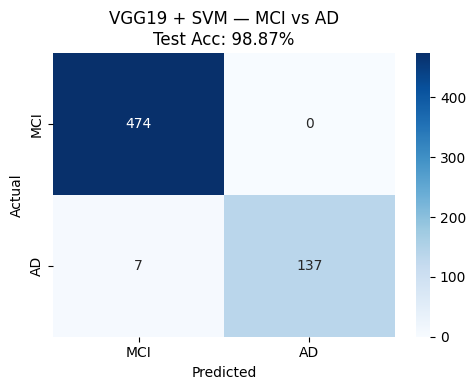


  AD vs CN
              precision    recall  f1-score   support

          AD     0.9930    0.9792    0.9860       144
          CN     0.9873    0.9957    0.9915       234

    accuracy                         0.9894       378
   macro avg     0.9901    0.9874    0.9888       378
weighted avg     0.9894    0.9894    0.9894       378



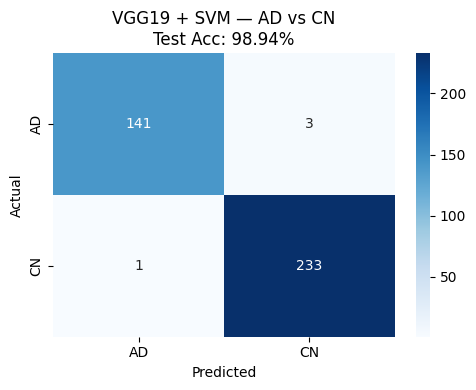


  MCI vs CN
              precision    recall  f1-score   support

         MCI     1.0000    0.9895    0.9947       474
          CN     0.9791    1.0000    0.9894       234

    accuracy                         0.9929       708
   macro avg     0.9895    0.9947    0.9921       708
weighted avg     0.9931    0.9929    0.9930       708



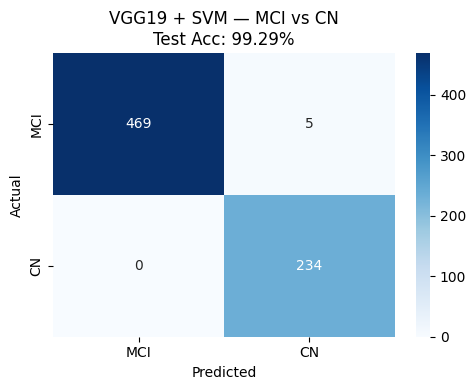

In [15]:
for tag, res in svm_results.items():
    cls_a, cls_b = res['cls_a'], res['cls_b']
    y_true = res['y_test']
    y_pred = res['svm'].predict(res['X_test'])

    print(f"\n{'='*55}")
    print(f"  {cls_a} vs {cls_b}")
    print(f"{'='*55}")
    print(classification_report(y_true, y_pred, target_names=[cls_a, cls_b], digits=4))

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=[cls_a, cls_b], yticklabels=[cls_a, cls_b])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'VGG19 + SVM — {cls_a} vs {cls_b}\nTest Acc: {res["test_acc"]:.2f}%')
    plt.tight_layout()
    plt.savefig(os.path.join(CKPT_DIR, f'cm_{tag}.png'), dpi=150)
    plt.show()

# Accuracy Comparison Chart

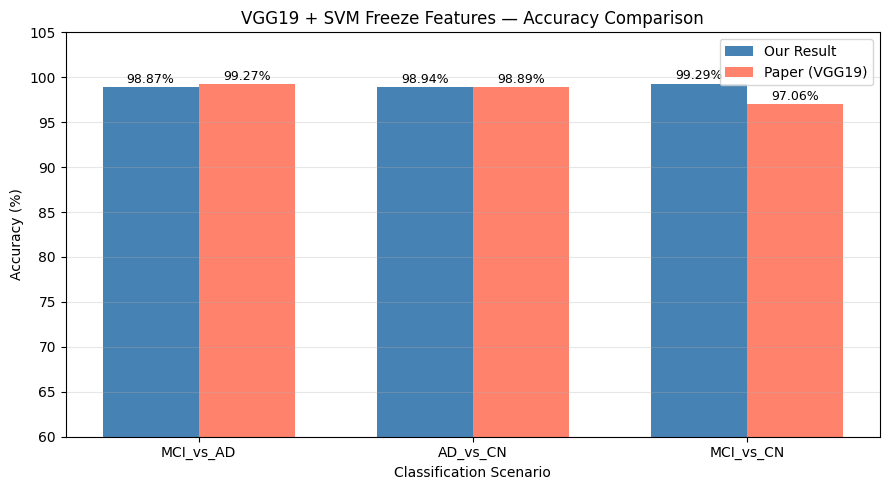

In [16]:
scenarios  = list(svm_results.keys())
test_accs  = [svm_results[t]['test_acc']  for t in scenarios]
paper_accs_list = [paper_accs.get(t, 0)  for t in scenarios]

x = np.arange(len(scenarios))
w = 0.35

fig, ax = plt.subplots(figsize=(9, 5))
bars1 = ax.bar(x - w/2, test_accs,       w, label='Our Result', color='steelblue')
bars2 = ax.bar(x + w/2, paper_accs_list, w, label='Paper (VGG19)', color='tomato', alpha=0.8)

ax.set_xlabel('Classification Scenario')
ax.set_ylabel('Accuracy (%)')
ax.set_title('VGG19 + SVM Freeze Features — Accuracy Comparison')
ax.set_xticks(x)
ax.set_xticklabels(scenarios)
ax.set_ylim(60, 105)
ax.legend()
ax.grid(axis='y', alpha=0.3)

for bar in bars1:
    ax.annotate(f'{bar.get_height():.2f}%',
                xy=(bar.get_x() + bar.get_width() / 2, bar.get_height()),
                xytext=(0, 3), textcoords='offset points', ha='center', fontsize=9)
for bar in bars2:
    ax.annotate(f'{bar.get_height():.2f}%',
                xy=(bar.get_x() + bar.get_width() / 2, bar.get_height()),
                xytext=(0, 3), textcoords='offset points', ha='center', fontsize=9)

plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'accuracy_comparison.png'), dpi=150)
plt.show()

# Saving Results

In [17]:
results_summary = {
    'model': 'VGG19_freeze_FC6_SVM',
    'feature_layer': 'classifier[0]  (FC6, 4096-dim)',
    'svm_kernel': 'rbf',
    'class_names': CLASS_NAMES,
    'scenarios': {}
}

for tag, res in svm_results.items():
    y_true = res['y_test']
    y_pred = res['svm'].predict(res['X_test'])
    precision, recall, f1, support = precision_recall_fscore_support(
        y_true, y_pred, average=None, zero_division=0)
    results_summary['scenarios'][tag] = {
        'class_a': res['cls_a'],
        'class_b': res['cls_b'],
        'val_accuracy': round(res['val_acc'], 4),
        'test_accuracy': round(res['test_acc'], 4),
        'paper_accuracy': paper_accs.get(tag),
        'per_class_metrics': {
            res['cls_a']: {'precision': float(precision[0]), 'recall': float(recall[0]), 'f1': float(f1[0])},
            res['cls_b']: {'precision': float(precision[1]), 'recall': float(recall[1]), 'f1': float(f1[1])},
        }
    }

results_path = os.path.join(CKPT_DIR, 'vgg19_svm_results.json')
with open(results_path, 'w') as f:
    json.dump(results_summary, f, indent=2)

print(f"✓ Results saved to: {results_path}")
print(f"✓ SVM checkpoints  : {CKPT_DIR}/svm_<scenario>.pkl")
print("\n" + "="*55)
print("  PIPELINE COMPLETE — VGG19 + SVM (Paper Architecture)")
print("="*55)

✓ Results saved to: /kaggle/working/checkpoints_vgg19_svm/vgg19_svm_results.json
✓ SVM checkpoints  : /kaggle/working/checkpoints_vgg19_svm/svm_<scenario>.pkl

  PIPELINE COMPLETE — VGG19 + SVM (Paper Architecture)


XAI

In [39]:
!pip install captum 

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.2/455.2 kB 9.0 MB/s eta 0:00:00ta 0:00:01


In [40]:
import cv2
import lime
from lime import lime_image
from skimage.segmentation import mark_boundaries
import shap
import torch.nn.functional as F
from captum.attr import Saliency
try:
    import captum
except ImportError:
    import subprocess, sys
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', 'captum', '-q'])
    from captum.attr import Saliency

In [48]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

normalize = transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)

def denormalize(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std  = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    return (tensor.cpu() * std + mean).clamp(0, 1)

def load_sample_image(dataset, idx=0):
    img_tensor, label = dataset[idx]
    img_display = (denormalize(img_tensor).permute(1, 2, 0).numpy() * 255).astype(np.uint8)
    return img_tensor, img_display, label

def clear_all_hooks(model):
    """Remove every forward/backward hook registered on any submodule."""
    for module in model.modules():
        module._forward_hooks.clear()
        module._forward_pre_hooks.clear()
        module._backward_hooks.clear()
        if hasattr(module, '_forward_hooks_with_kwargs'):
            module._forward_hooks_with_kwargs.clear()

def vgg19_predict_proba(extractor, svm_info, images_np):
    """
    Full VGG19 → SVM prediction pipeline.
    images_np : list of (H, W, 3) uint8 images
    Returns   : (N, 2) probability array
    """
    batch = []
    for img in images_np:
        t = transforms.ToTensor()(img)
        t = normalize(t)
        batch.append(t)
    batch = torch.stack(batch).to(device)

    fc6_out = {}
    def hook_fn(module, inp, out):
        fc6_out['feat'] = out.detach().cpu()

    hook = extractor.classifier[0].register_forward_hook(hook_fn)
    extractor.eval()
    with torch.no_grad():
        extractor(batch)
    hook.remove()

    feats    = fc6_out['feat'].numpy()
    feats_sc = svm_info['scaler'].transform(feats)
    return svm_info['svm'].predict_proba(feats_sc)

scenario_samples = {}
for tag, res in svm_results.items():
    cls_a, cls_b = res['cls_a'], res['cls_b']
    found = {cls_a: None, cls_b: None}
    for i, (_, lbl) in enumerate(test_ds.samples):
        cls = CLASS_NAMES[lbl]
        if cls in found and found[cls] is None:
            found[cls] = i
        if all(v is not None for v in found.values()):
            break
    scenario_samples[tag] = found

print('Sample indices per scenario:', scenario_samples)

Sample indices per scenario: {'MCI_vs_AD': {'MCI': 378, 'AD': 0}, 'AD_vs_CN': {'AD': 0, 'CN': 144}, 'MCI_vs_CN': {'MCI': 378, 'CN': 144}}



LIME  |  MCI_vs_AD  |  sample class: MCI


  0%|          | 0/1000 [00:00<?, ?it/s]

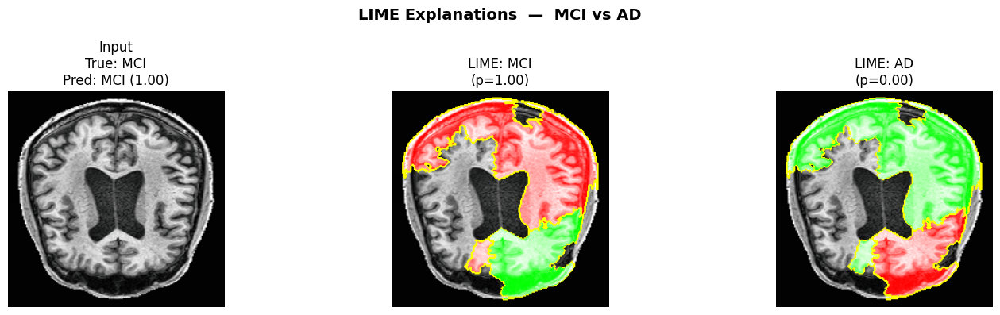


LIME  |  MCI_vs_AD  |  sample class: AD


  0%|          | 0/1000 [00:00<?, ?it/s]

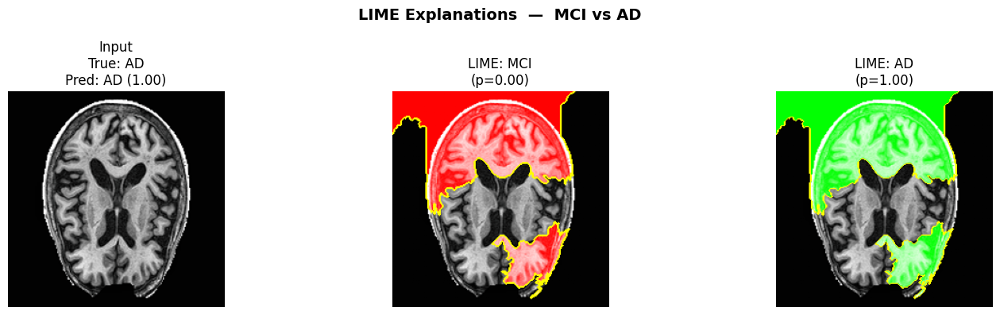


LIME  |  AD_vs_CN  |  sample class: AD


  0%|          | 0/1000 [00:00<?, ?it/s]

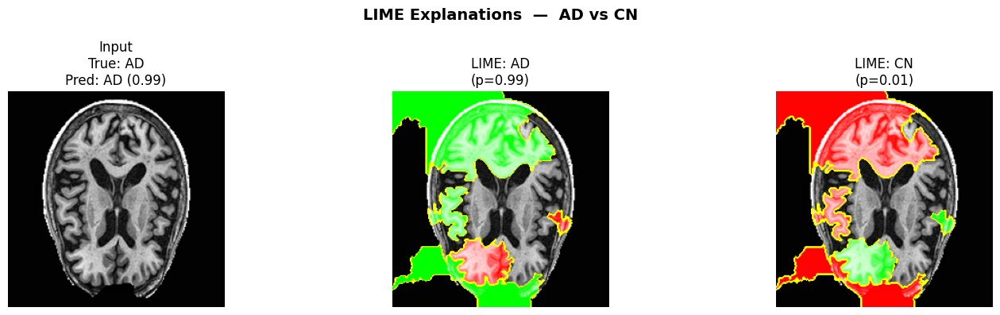


LIME  |  AD_vs_CN  |  sample class: CN


  0%|          | 0/1000 [00:00<?, ?it/s]

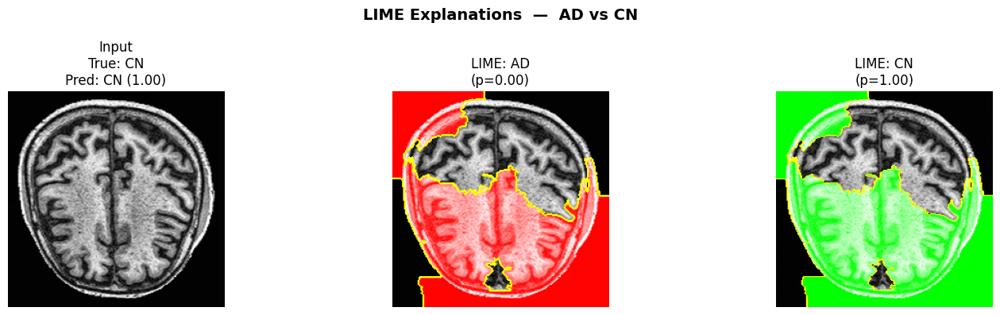


LIME  |  MCI_vs_CN  |  sample class: MCI


  0%|          | 0/1000 [00:00<?, ?it/s]

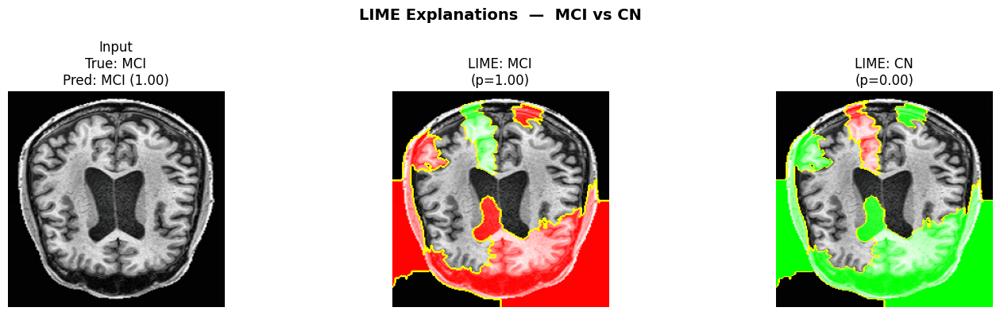


LIME  |  MCI_vs_CN  |  sample class: CN


  0%|          | 0/1000 [00:00<?, ?it/s]

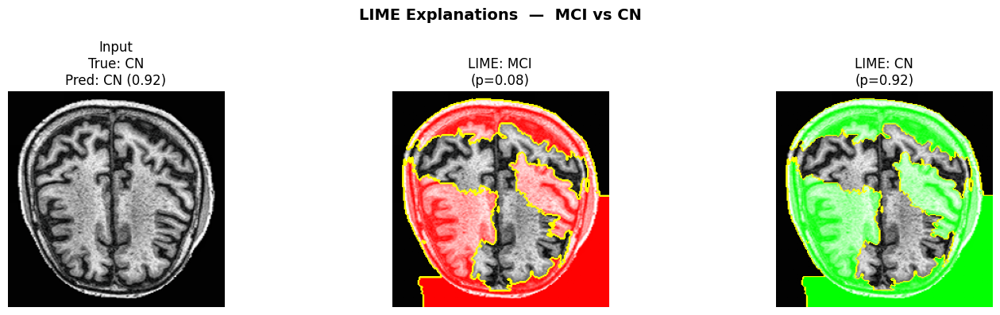

In [49]:
def lime_explain_svm(extractor, svm_info, dataset, sample_idx, cls_names,
                     num_samples=1000):
    clear_all_hooks(extractor)

    img_tensor, img_display, true_label = load_sample_image(dataset, sample_idx)

    def batch_predict(images):
        batch = []
        for img in images:
            t = transforms.ToTensor()(img)
            t = normalize(t)
            batch.append(t)
        batch = torch.stack(batch).to(device)

        fc6_out = {}
        def hook_fn(module, inp, out):
            fc6_out['feat'] = out.detach().cpu()

        hook = extractor.classifier[0].register_forward_hook(hook_fn)
        extractor.eval()
        with torch.no_grad():
            extractor(batch)
        hook.remove()

        feats    = fc6_out['feat'].numpy()
        feats_sc = svm_info['scaler'].transform(feats)
        return svm_info['svm'].predict_proba(feats_sc)

    pred_probs     = batch_predict([img_display])[0]
    pred_label_idx = pred_probs.argmax()
    pred_name      = cls_names[pred_label_idx]
    true_name      = CLASS_NAMES[true_label]

    explainer   = lime_image.LimeImageExplainer(random_state=42)
    explanation = explainer.explain_instance(
        img_display,
        batch_predict,
        top_labels=2,
        hide_color=0,
        num_samples=num_samples,
    )

    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    axes[0].imshow(img_display)
    axes[0].set_title(f'Input\nTrue: {true_name}\nPred: {pred_name} ({pred_probs[pred_label_idx]:.2f})')
    axes[0].axis('off')

    for i, cls_idx in enumerate([0, 1]):
        temp, mask = explanation.get_image_and_mask(
            cls_idx, positive_only=False,
            num_features=10, hide_rest=False
        )
        axes[i + 1].imshow(mark_boundaries(temp / 255.0, mask))
        axes[i + 1].set_title(f'LIME: {cls_names[cls_idx]}\n(p={pred_probs[cls_idx]:.2f})')
        axes[i + 1].axis('off')

    plt.suptitle(f'LIME Explanations  —  {cls_names[0]} vs {cls_names[1]}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    return explanation

for tag, res in svm_results.items():
    cls_a, cls_b = res['cls_a'], res['cls_b']
    cls_names = [cls_a, cls_b]
    svm_info  = {'svm': res['svm'], 'scaler': res['scaler']}
    for cls, idx in scenario_samples[tag].items():
        print(f'\nLIME  |  {tag}  |  sample class: {cls}')
        lime_explain_svm(extractor, svm_info, test_ds, idx, cls_names)

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:34, 34.18s/it]               


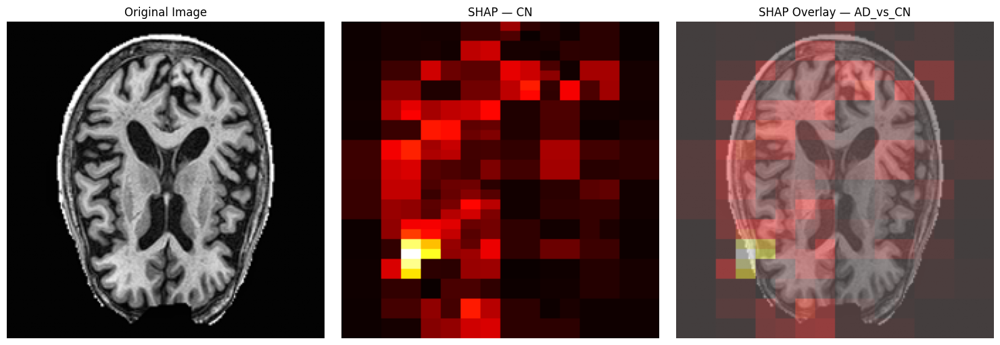

In [61]:
import shap
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

def compute_shap_explanation(image_path, scenario_tag, max_evals=1000):
    res     = svm_results[scenario_tag]
    svm     = res['svm']
    scaler  = res['scaler']
    cls_a   = res['cls_a']
    cls_b   = res['cls_b']

    raw = torch.load(image_path, weights_only=True).float() / 255.0
    img_np  = (raw[0].numpy() * 255).astype(np.uint8)
    img_rgb = raw.permute(1, 2, 0).numpy()
    img_rgb = (img_rgb * 255).astype(np.uint8)
    extractor.to(device)
    extractor.eval()

    # --- SHAP predict function ---
    def predict_fn(images):
        tensors = []
        for img_arr in images:
            t = transforms.ToTensor()(img_arr).float()
            t = transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)(t)
            tensors.append(t)
        batch = torch.stack(tensors).to(device)

        fc6_out = {}
        def hook_fn(module, input, output):
            fc6_out['feat'] = output.detach().cpu()

        hook = extractor.classifier[0].register_forward_hook(hook_fn)
        with torch.no_grad():
            _ = extractor(batch)
        hook.remove()

        features    = fc6_out['feat'].numpy()
        features_sc = scaler.transform(features)
        probs       = svm.predict_proba(features_sc)
        return probs

    # --- run SHAP ---
    masker    = shap.maskers.Image("blur(32,32)", img_rgb.shape)
    explainer = shap.Explainer(predict_fn, masker, output_names=[cls_a, cls_b])
    shap_values = explainer(
        img_rgb[np.newaxis, ...],
        max_evals=max_evals,
        batch_size=32,
    )

    # --- visualise for cls_b (index 1) ---
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(img_np, cmap='gray')
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    shap_img = shap_values.values[0, :, :, :, 1]
    shap_map = np.mean(np.abs(shap_img), axis=-1)
    shap_map = (shap_map - shap_map.min()) / (shap_map.max() - shap_map.min() + 1e-8)

    axes[1].imshow(shap_map, cmap='hot')
    axes[1].set_title(f'SHAP — {cls_b}')
    axes[1].axis('off')

    axes[2].imshow(img_np, cmap='gray', alpha=0.6)
    axes[2].imshow(shap_map, cmap='hot', alpha=0.4)
    axes[2].set_title(f'SHAP Overlay — {scenario_tag}')
    axes[2].axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(CKPT_DIR, f'shap_{scenario_tag}.png'), dpi=150)
    plt.show()
    return shap_values

# --- pick a test image and run ---
sample_path, sample_label = test_ds.samples[0]

shap_values = compute_shap_explanation(
    image_path   = sample_path,
    scenario_tag = "AD_vs_CN",   
    max_evals    = 2000,
)

In [55]:
class GradCAM_VGG19:
    def __init__(self, model):
        self.model = model

    def generate(self, input_tensor, target_class=None):
        gradients   = {}
        activations = {}
        target_layer = self.model.features[35]

        def forward_hook(module, inp, out):
            activations['v'] = out

        def backward_hook(module, grad_in, grad_out):
            gradients['v'] = grad_out[0].detach()

        fh = target_layer.register_forward_hook(forward_hook)
        bh = target_layer.register_full_backward_hook(backward_hook)

        relu_layers = [m for m in self.model.modules() if isinstance(m, torch.nn.ReLU)]
        for r in relu_layers:
            r.inplace = False

        try:
            with torch.enable_grad():
                for p in self.model.parameters():
                    p.requires_grad_(True)
                self.model.eval()
                inp = input_tensor.unsqueeze(0).to(device)
                inp.requires_grad_(True)
                output = self.model(inp)
                if target_class is None:
                    target_class = output.argmax(dim=1).item()
                self.model.zero_grad()
                output[0, target_class].backward()

            weights = gradients['v'].mean(dim=(2, 3), keepdim=True)
            cam     = (weights * activations['v'].detach()).sum(dim=1, keepdim=True)
            cam     = F.relu(cam).squeeze().cpu().numpy()
            cam     = cv2.resize(cam, (inp.shape[-1], inp.shape[-2]))
            cam     = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

        finally:
            fh.remove()
            bh.remove()
            for r in relu_layers:
                r.inplace = True
            for p in self.model.parameters():
                p.requires_grad_(False)

        return cam, target_class
        def gradcam_explain_svm(extractor, svm_info, dataset, sample_idx, cls_names):
            clear_all_hooks(extractor)
            
            img_tensor, img_display, true_label = load_sample_image(dataset, sample_idx)
            
            pred_probs = vgg19_predict_proba(extractor, svm_info, [img_display])[0]
            pred_idx   = pred_probs.argmax()
            true_name  = CLASS_NAMES[true_label]
            pred_name  = cls_names[pred_idx]
            
            with torch.no_grad():
                vgg_top = extractor(img_tensor.unsqueeze(0).to(device)).argmax(dim=1).item()
            
            gcam = GradCAM_VGG19(extractor)
            
            fig, axes = plt.subplots(1, 3, figsize=(15, 4))
            axes[0].imshow(img_display)
            axes[0].set_title(f'Input\nTrue: {true_name}\nPred: {pred_name} ({pred_probs[pred_idx]:.2f})')
            axes[0].axis('off')
            
            for i, (cls_idx, cname) in enumerate(zip([0, 1], cls_names)):
                cam, _ = gcam.generate(img_tensor.clone(), target_class=vgg_top)
                heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
                heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
                overlay = (0.5 * img_display.astype(float) + 0.5 * heatmap.astype(float)).astype(np.uint8)
                axes[i + 1].imshow(overlay)
                axes[i + 1].set_title(f'Grad-CAM: {cname}\n(SVM p={pred_probs[cls_idx]:.2f})')
                axes[i + 1].axis('off')
        
            plt.suptitle(f'Grad-CAM Explanations  —  {cls_names[0]} vs {cls_names[1]}',
                         fontsize=14, fontweight='bold')
            plt.tight_layout()
            plt.show()


Grad-CAM  |  MCI_vs_AD  |  sample class: MCI


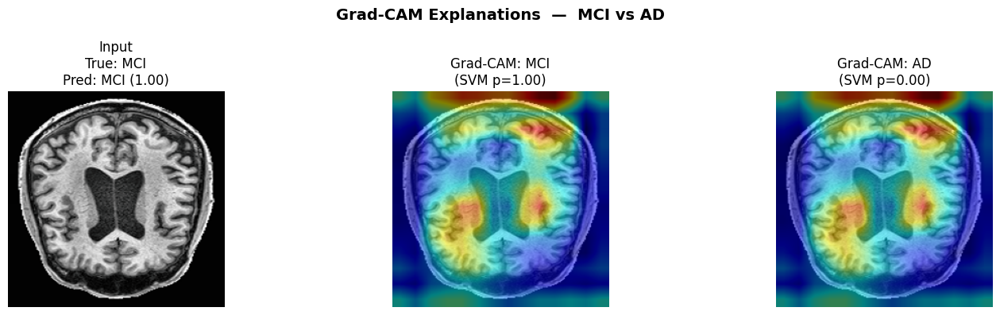


Grad-CAM  |  MCI_vs_AD  |  sample class: AD


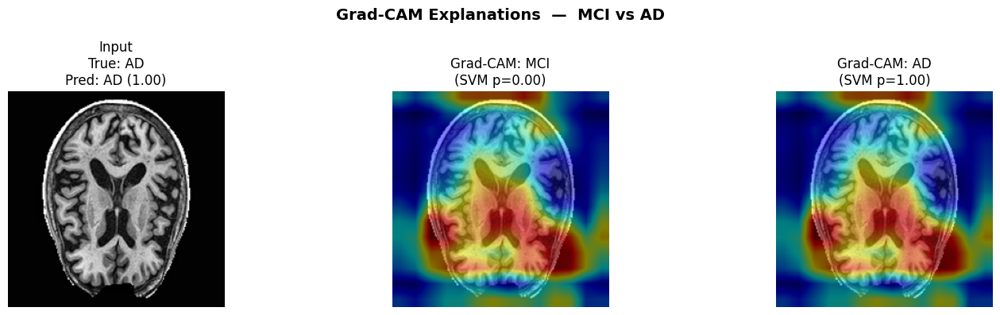


Grad-CAM  |  AD_vs_CN  |  sample class: AD


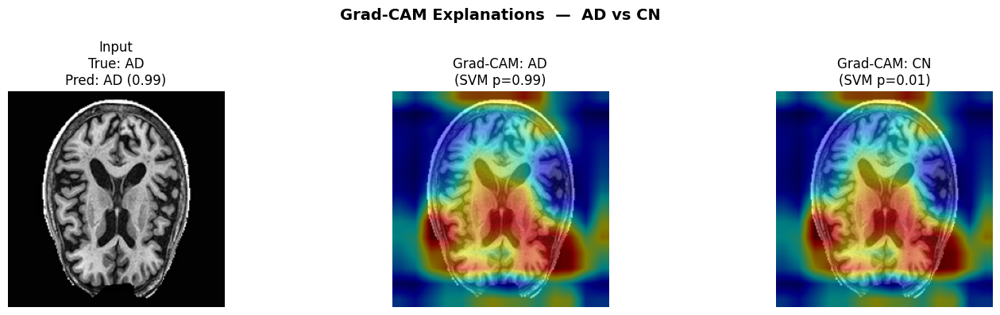


Grad-CAM  |  AD_vs_CN  |  sample class: CN


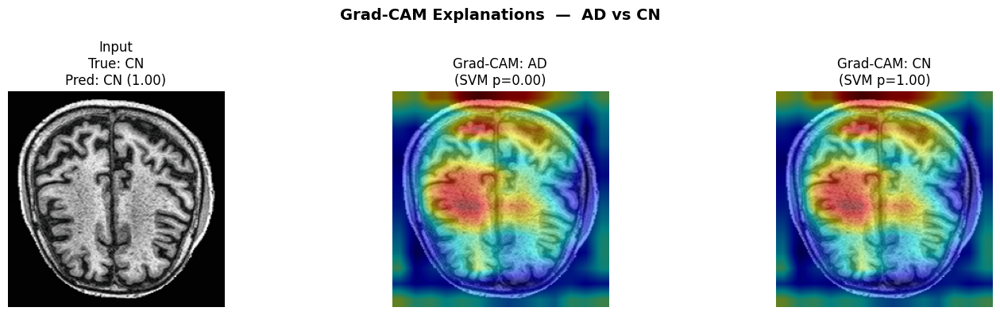


Grad-CAM  |  MCI_vs_CN  |  sample class: MCI


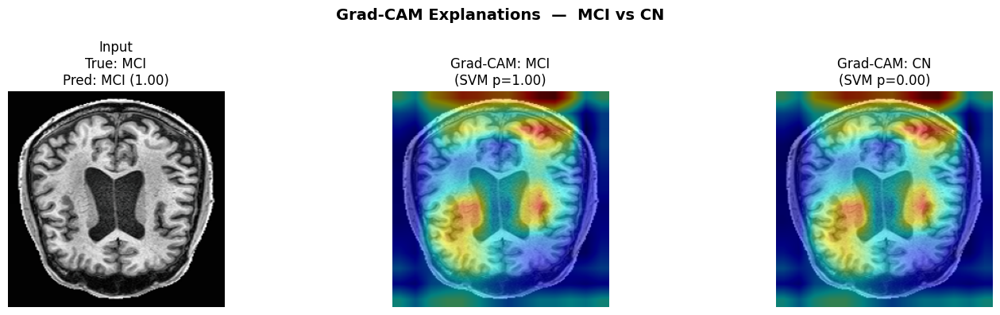


Grad-CAM  |  MCI_vs_CN  |  sample class: CN


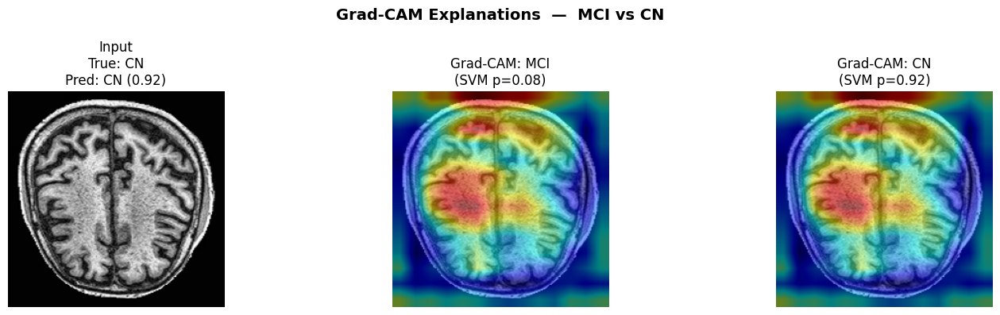

In [56]:
for tag, res in svm_results.items():
    cls_a, cls_b = res['cls_a'], res['cls_b']
    cls_names = [cls_a, cls_b]
    svm_info  = {'svm': res['svm'], 'scaler': res['scaler']}
    for cls, idx in scenario_samples[tag].items():
        print(f'\nGrad-CAM  |  {tag}  |  sample class: {cls}')
        gradcam_explain_svm(extractor, svm_info, test_ds, idx, cls_names)


Saliency  |  MCI_vs_AD  |  sample class: MCI


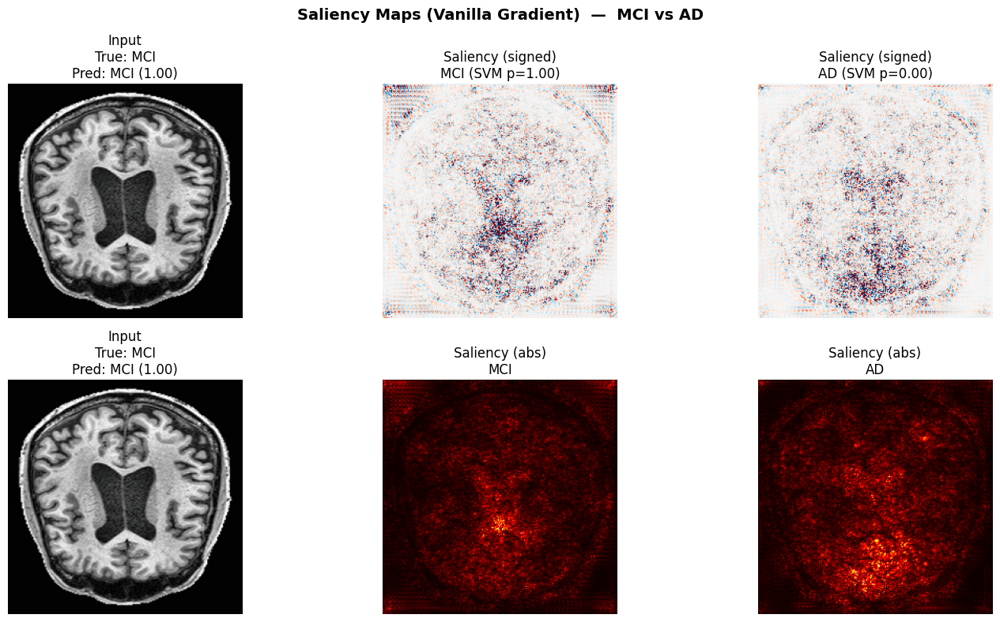


Saliency  |  MCI_vs_AD  |  sample class: AD


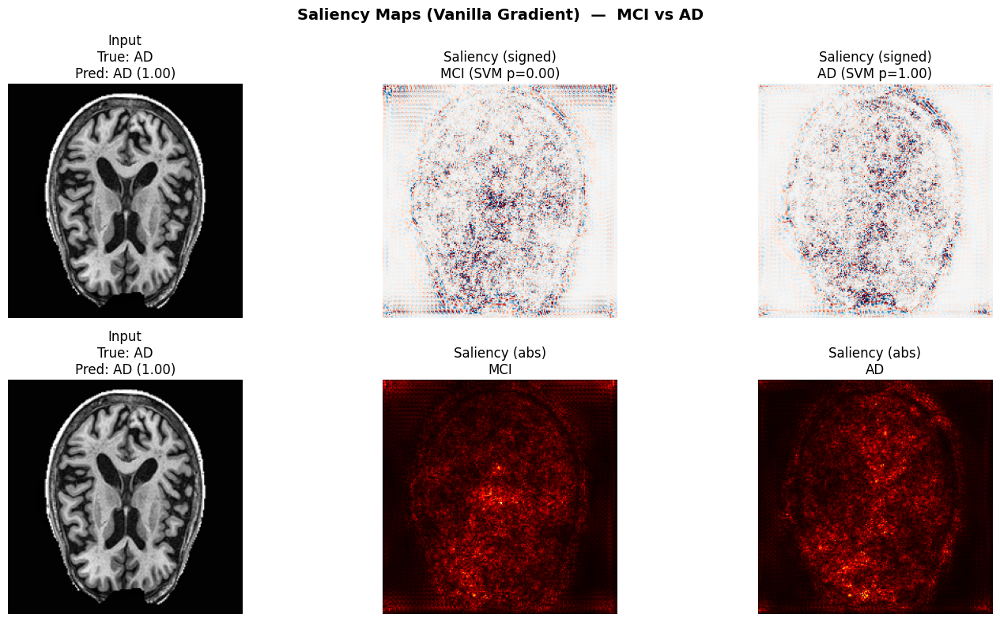


Saliency  |  AD_vs_CN  |  sample class: AD


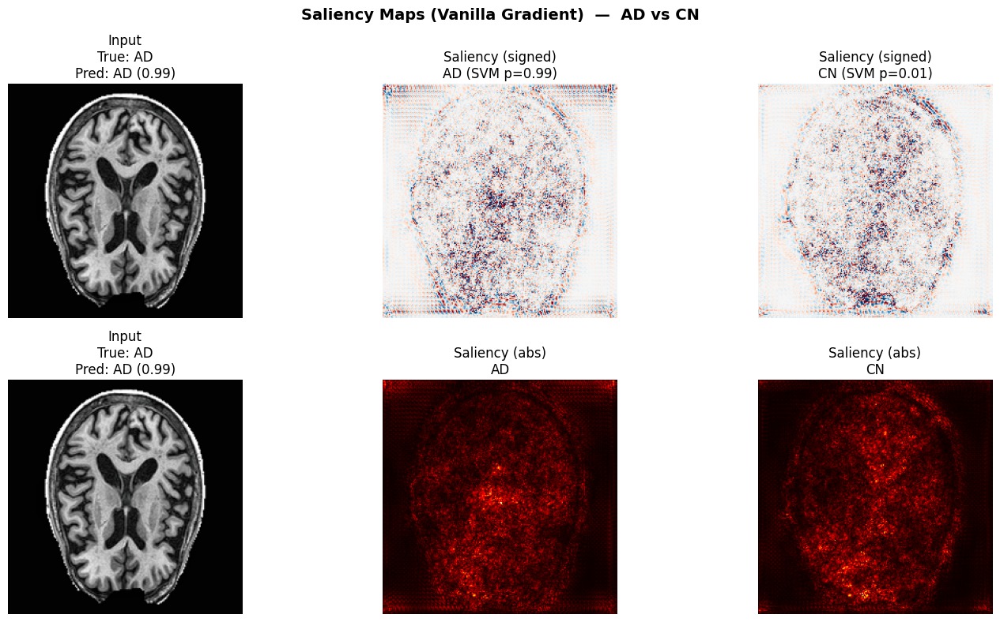


Saliency  |  AD_vs_CN  |  sample class: CN


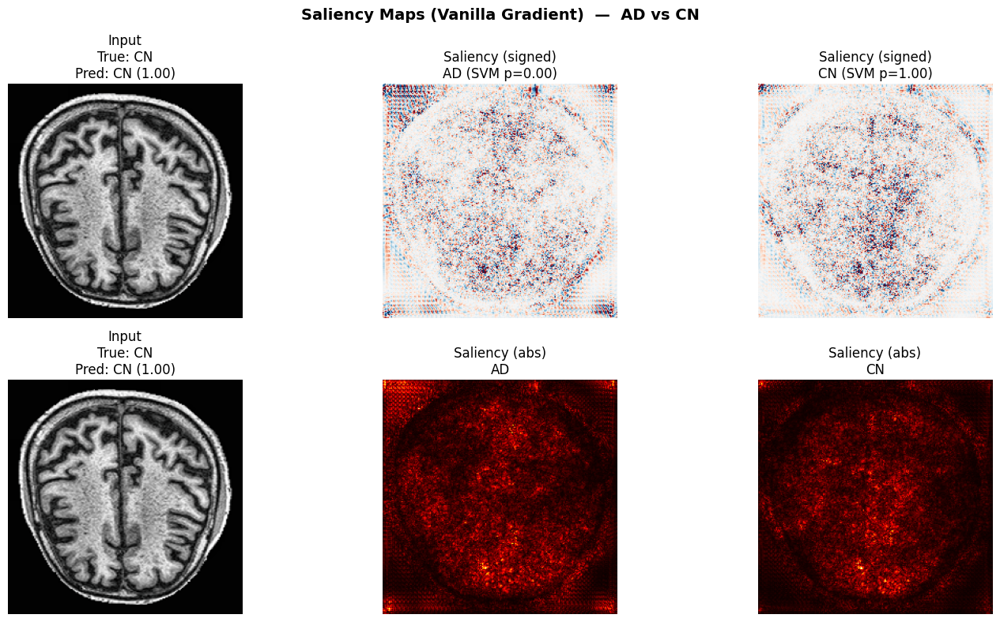


Saliency  |  MCI_vs_CN  |  sample class: MCI


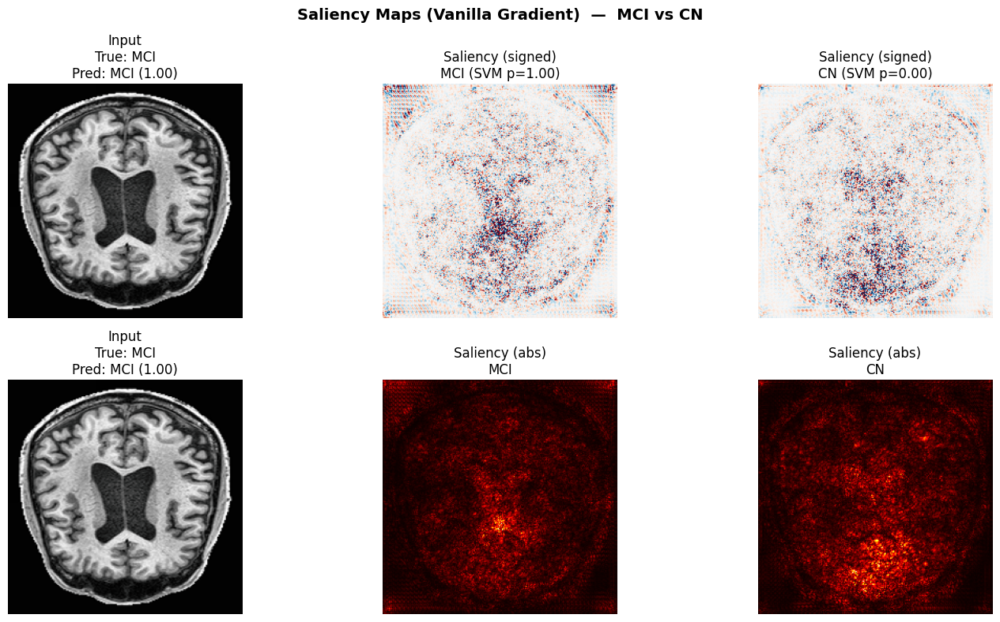


Saliency  |  MCI_vs_CN  |  sample class: CN


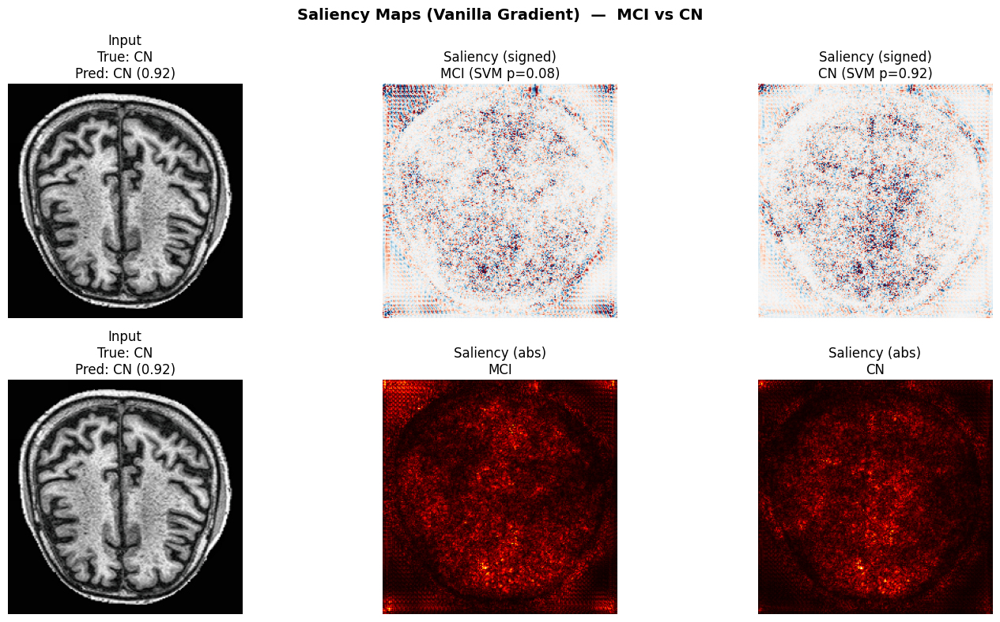

In [58]:
def saliency_explain_svm(extractor, svm_info, dataset, sample_idx, cls_names):
    clear_all_hooks(extractor)
    img_tensor, img_display, true_label = load_sample_image(dataset, sample_idx)
    input_tensor = img_tensor.unsqueeze(0).to(device)

    pred_probs = vgg19_predict_proba(extractor, svm_info, [img_display])[0]
    pred_idx   = pred_probs.argmax()
    true_name  = CLASS_NAMES[true_label]
    pred_name  = cls_names[pred_idx]

    with torch.no_grad():
        vgg_top = extractor(input_tensor).argmax(dim=1).item()

    for p in extractor.parameters():
        p.requires_grad_(True)

    input_tensor = input_tensor.requires_grad_(True)

    sal = Saliency(extractor)
    fig, axes = plt.subplots(2, 3, figsize=(15, 8))

    for row in range(2):
        axes[row, 0].imshow(img_display)
        axes[row, 0].set_title(f'Input\nTrue: {true_name}\nPred: {pred_name} ({pred_probs[pred_idx]:.2f})')
        axes[row, 0].axis('off')

    for i, (cls_idx, cname) in enumerate(zip([0, 1], cls_names)):
        attr    = sal.attribute(input_tensor, target=cls_idx, abs=False)
        attr_np = attr.squeeze().cpu().detach().numpy()

        signed = attr_np.mean(axis=0)
        vmax   = np.percentile(np.abs(signed), 99)
        axes[0, i + 1].imshow(signed, cmap='RdBu_r', vmin=-vmax, vmax=vmax)
        axes[0, i + 1].set_title(f'Saliency (signed)\n{cname} (SVM p={pred_probs[cls_idx]:.2f})')
        axes[0, i + 1].axis('off')

        absolute = np.abs(attr_np).max(axis=0)
        absolute = (absolute - absolute.min()) / (absolute.max() - absolute.min() + 1e-8)
        axes[1, i + 1].imshow(absolute, cmap='hot')
        axes[1, i + 1].set_title(f'Saliency (abs)\n{cname}')
        axes[1, i + 1].axis('off')

    plt.suptitle(f'Saliency Maps (Vanilla Gradient)  —  {cls_names[0]} vs {cls_names[1]}',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

    for p in extractor.parameters():
        p.requires_grad_(False)

for tag, res in svm_results.items():
    cls_a, cls_b = res['cls_a'], res['cls_b']
    cls_names = [cls_a, cls_b]
    svm_info  = {'svm': res['svm'], 'scaler': res['scaler']}
    for cls, idx in scenario_samples[tag].items():
        print(f'\nSaliency  |  {tag}  |  sample class: {cls}')
        saliency_explain_svm(extractor, svm_info, test_ds, idx, cls_names)

In [62]:
import os
import shutil
from IPython.display import FileLink, display

print("="*60)
print("Packaging all files into a single ZIP...")
print("="*60)

import joblib
svm_save_path = os.path.join(CKPT_DIR, 'svm_model_final.pkl')
joblib.dump(svm, svm_save_path)

zip_path = "/kaggle/temp/all_project_outputs.zip"
os.makedirs("/kaggle/temp", exist_ok=True)
shutil.make_archive(zip_path.replace('.zip', ''), 'zip', '/kaggle/working')

final_zip_path = "/kaggle/working/all_project_outputs.zip"
shutil.move(zip_path, final_zip_path)

print("\n✅ Done! Click the link below to download everything in one file:")
display(FileLink("all_project_outputs.zip"))

Packaging all files into a single ZIP...

✅ Done! Click the link below to download everything in one file:


/kaggle/working/all_project_outputs.zip